# Quick Start (Cell Bin)

In this case, we use the `.cellbin.gef` file of mouse brain generated by Stereo-seq for downstream analysis. 

More information of GEF file is in the [documentation](https://www.processon.com/view/link/610cc49c7d9c087bbd1ab7ab#map). Usually, we recommend using GEF whose speed of being read is much faster than GEM.

## Reading data

Firstly, download our [example data](http://116.6.21.110:8090/share/c5d9e7f3-7d66-4154-87e1-a740f4bb4dbc) and import Stereopy.

In [1]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

Get the version information of Stereopy.

In [2]:
st.__version__

'1.1.0'

Get attributes of the GEF file

In [3]:
data_path = './SS200000135TL_D1.cellbin.gef'
st.io.read_gef_info(data_path)

[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1354][INFO]: This is GEF file which contains cell bin infomation.
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1355][INFO]: bin_type: cell_bins
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1361][INFO]: Number of cells: 57133
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1364][INFO]: Number of gene: 24670
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1367][INFO]: Resolution: 500
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1370][INFO]: offsetX: 0
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1373][INFO]: offsetY: 0
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1376][INFO]: Average number of genes: 223.460693359375
[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1379][INFO]: Maximum number of genes: 104

version is 0.7.14 


{'cell_num': 57133,
 'gene_num': 24670,
 'resolution': 500,
 'offsetX': 0,
 'offsetY': 0,
 'averageGeneCount': 223.4607,
 'maxGeneCount': 1046,
 'averageExpCount': 399.17035,
 'maxExpCount': 2337}

<div class="alert alert-info">

**Note**

`bin_type` should be set to `'cell_bins'`, if read a GEF file of `.cellbin.gef`, which is significantly different from Square Bin.

</div>

Load data to generate a StereoExpData object.

In [4]:
data = st.io.read_gef(file_path=data_path, bin_type='cell_bins')

# simply type the varibale to get related information
data

[2024-01-17 10:23:10][Stereo][4130][MainThread][140049799059264][reader][1070][INFO]: read_gef begin ...


version is 0.7.14 


[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1354][INFO]: This is GEF file which contains cell bin infomation.
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1355][INFO]: bin_type: cell_bins
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1361][INFO]: Number of cells: 57133
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1364][INFO]: Number of gene: 24670
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1367][INFO]: Resolution: 500
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1370][INFO]: offsetX: 0
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1373][INFO]: offsetY: 0
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1376][INFO]: Average number of genes: 223.460693359375
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][reader][1379][INFO]: Maximum number of genes: 104

version is 0.7.14 


StereoExpData object with n_cells X n_genes = 57133 X 24670
bin_type: cell_bins
offset_x = None
offset_y = None
cells: ['cell_name', 'dnbCount', 'area']
genes: ['gene_name']
result: []

##  Preprocessing

Data preprocessing includes three modules: quality control, filtering and normalization.

#### Quality Control

This module calculates the quality distribution of original data, using three indicators:

    total_counts - the total counts per cell;

    n_genes_by_counts - the number of genes expressed in count maxtrix;

    pct_countss_mt - the percentage of counts in mitochondrial genes.

In [5]:
data.tl.cal_qc()

[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run cal_qc...
[2024-01-17 10:23:11][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: cal_qc end, consume time 0.3780s.


Show the violin figure of QC distribution.

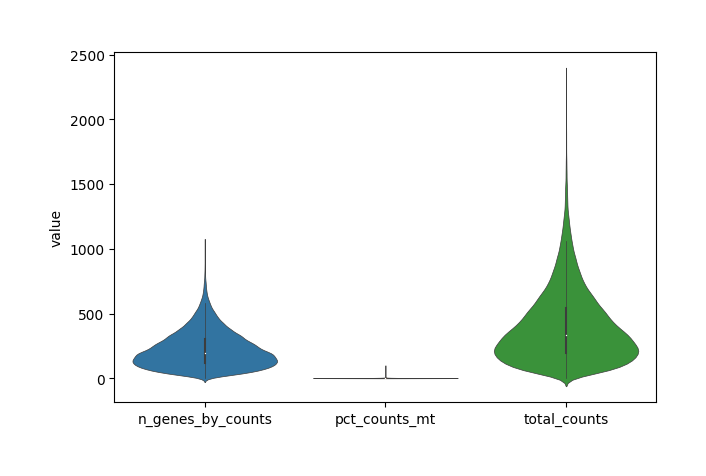

In [6]:
data.plt.violin()

Show the spatial scatter figure of QC distribution.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

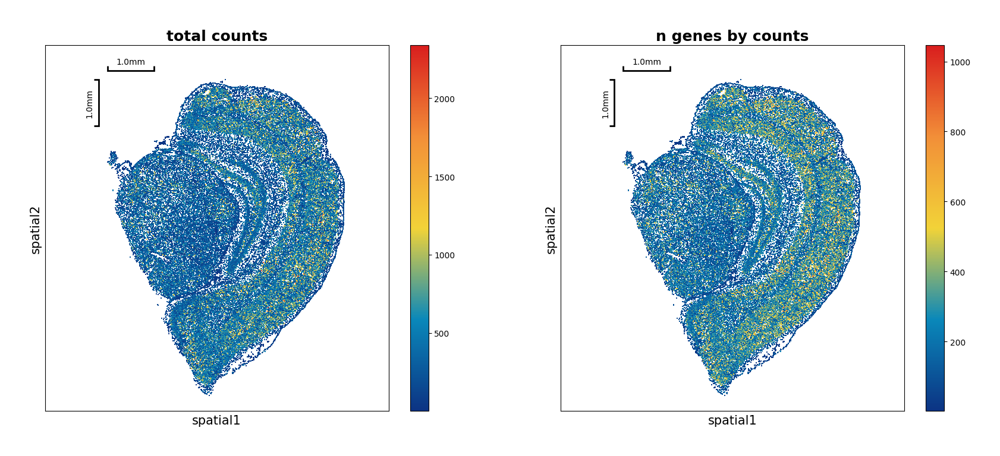

In [7]:
data.plt.spatial_scatter()

#### Filtering

Three basic methods are provided to filter data maxtrix:

`data.tl.filter_cells`,
`data.tl.filter_genes`,
`data.tl.filter_coordinates`.

We filter cells based on quality control indicators which have been calculated in QC part. Beforehand, observe the distribution of cells according to scatter plots.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

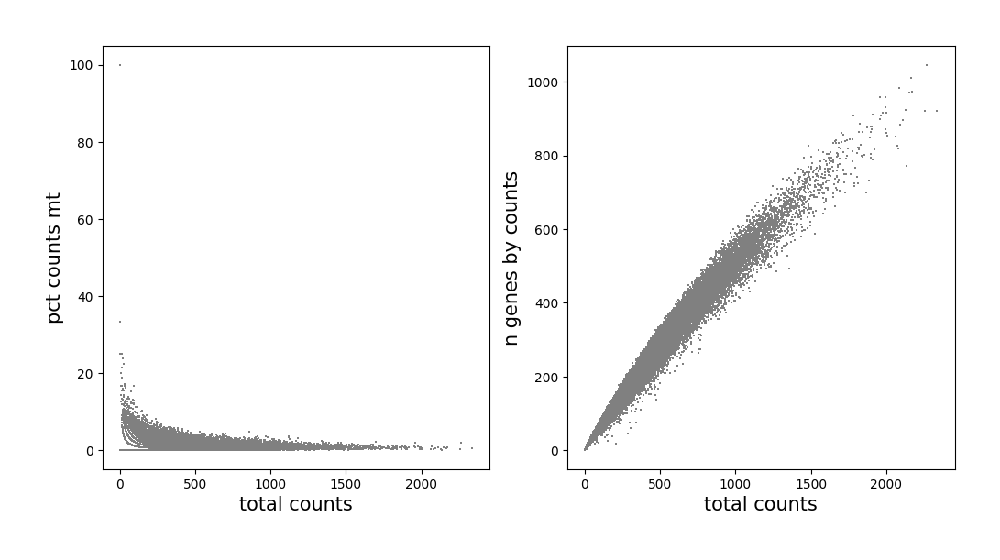

In [8]:
data.plt.genes_count()

Remove cells that have too many mitochondrial genes expressed, without enough genes expressed, and out of count range.

In [9]:
data.tl.filter_cells(
        min_counts=200, 
        min_genes=3, 
        max_genes=2500, 
        pct_counts_mt=5, 
        inplace=True
        )
data

[2024-01-17 10:23:17][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run filter_cells...
[2024-01-17 10:23:17][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: filter_cells end, consume time 0.5199s.


StereoExpData object with n_cells X n_genes = 41948 X 24670
bin_type: cell_bins
offset_x = None
offset_y = None
cells: ['cell_name', 'dnbCount', 'area', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
result: []

<div class="alert alert-info">

**Note**

We strongly suggest to use `self.raw` to record the raw gene expression matrix which has been gone through basic processing, as an essential data set for subsequent differential testing and multiple analysis.

</div>

So in order to save the data and recall it conveniently, you can save the raw expression matrix by `data.tl.raw_checkpoint()`. 

In [10]:
data.tl.raw_checkpoint()

In [11]:
data.tl.raw

StereoExpData object with n_cells X n_genes = 41948 X 24670
bin_type: cell_bins
offset_x = None
offset_y = None
cells: ['cell_name', 'dnbCount', 'area', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
result: []

<div class="alert alert-info">

**Note**

When you want to get raw data, just run `data.tl.reset_raw_data()`.

</div>

#### Normalization

In this module, you can choose from following common methods of standardization:

- [normalize_total](https://www.nature.com/articles/nbt.3192)
- [log1p](https://academic.oup.com/bioinformatics/article/37/15/2223/6155989)
- scale
- [scTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1)
- [quantile](https://github.com/panjie-payne/test-sphinx/blob/master/docs/source/_static/quantile.pdf)

<div class="alert alert-info">

**Note**

If the parameter `inplace` is set to `True` by default, expression matrix data will be replaced by the corresponding result(here replaced by the normalized result), otherwise unchanged.

</div>

Run a combination method of `normalize_total` and `log1p` to normalize gene expression matrix as below:

In [12]:
# inplace is set to True by default

data.tl.normalize_total()
data.tl.log1p()

[2024-01-17 10:23:17][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run normalize_total...
[2024-01-17 10:23:17][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: normalize_total end, consume time 0.1879s.
[2024-01-17 10:23:17][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run log1p...
[2024-01-17 10:23:18][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: log1p end, consume time 0.0988s.


If you use `data.tl.sctransform` which includes the function of finding highly variable genes, you do not need to run `data.tl.highly_variable_genes`. In the subsequent `data.tl.pca` method, the parameter `use_highly_genes` has to be set as `False`. In brief, whether to use highly variable genes to run PCA depends on `filter_hvgs` in the normalization of scTransform. Learn more about [scTransform](https://github.com/BGIResearch/stereopy/blob/main/docs/source/Tutorials/sctransform.ipynb).

#### Highly variable genes

Identify highly variable genes in cells.

In [13]:
data.tl.highly_variable_genes(
            min_mean=0.0125, 
            max_mean=3,
            min_disp=0.5,
            n_top_genes=2000, 
            res_key='highly_variable_genes'
            )

[2024-01-17 10:23:18][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run highly_variable_genes...
[2024-01-17 10:23:18][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: highly_variable_genes end, consume time 0.2935s.


If `data.tl.scale(zero_center=False)` is used, sparse matrix will be used for calculation, which can greatly reduce the memory required for running.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

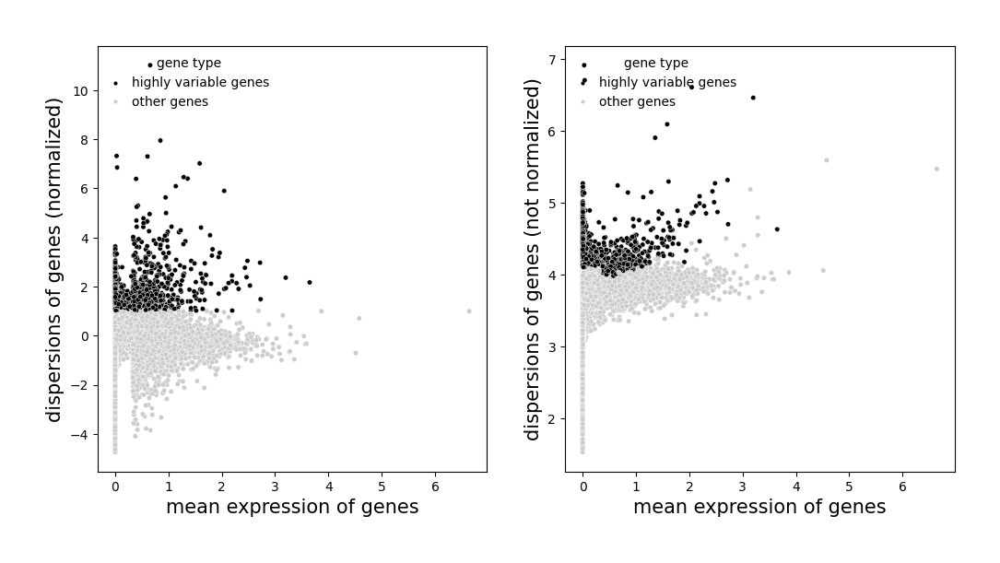

In [14]:
# remember to choose a res_key when plot

data.plt.highly_variable_genes(res_key='highly_variable_genes')

Scale each gene to unit variance. Clip values exceeding standard deviation 10. If `data.tl.scale(zero_center=False)` is used, sparse matrix will be used for calculation, which can greatly reduce the memory required for running.

In [15]:
data.tl.scale()

[2024-01-17 10:23:20][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run scale...
[2024-01-17 10:23:31][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: scale end, consume time 11.6879s.


## Embedding

#### PCA (Principal component analysis)

As a statistical technique for reducing dimensionality of a data set, PCA finds the max axes of greatest variation, which preserve as much information as possible. Notice that if set parameter `use_highly_genes` to `True`, only highly variable genes are used to run.

In [16]:
data.tl.pca(
        use_highly_genes=True, 
        n_pcs=30, 
        res_key='pca'
        )

[2024-01-17 10:23:31][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run pca...
[2024-01-17 10:23:40][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: pca end, consume time 8.5786s.


When the parameter `res_key` arises, the corresponding result will be **stored automatically**, simply check:

data.tl.key_record

We can plot the `elbow` to help us to determine how to choose PCs to be used.

[2024-01-17 10:23:40][Stereo][4130][MainThread][140049799059264][plot_collection][84][INFO]: register plot_func elbow to <stereo.plots.plot_collection.PlotCollection object at 0x7f5f4306e340>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

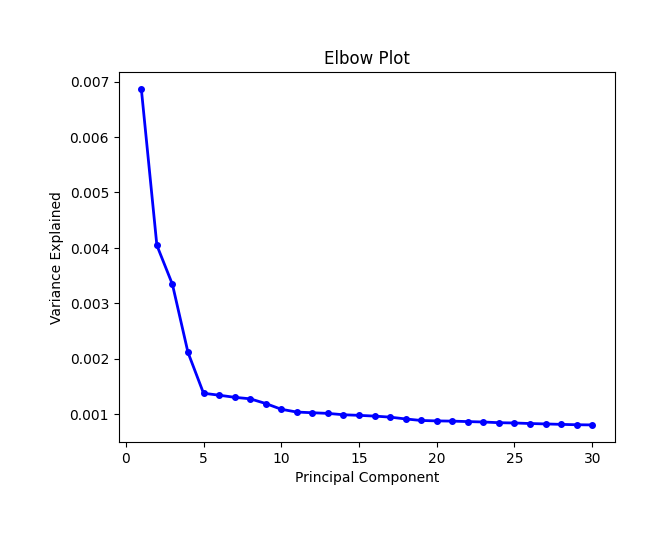

In [17]:
data.plt.elbow(pca_res_key='pca')

#### Neighborhood graph 

After PCA, we compute the neighborhood graph of cells using the PCA representation of the expression matrix.

In [18]:
data.tl.neighbors(pca_res_key='pca', res_key='neighbors')

[2024-01-17 10:23:40][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run neighbors...
[2024-01-17 10:24:01][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: neighbors end, consume time 21.1535s.


In addition, we also provide `data.tl.spatial_neighbors` function to compute a spatial neighbors graph.

#### UMAP

It's strongly to suggest embedding the graph in two dimensions using UMAP.

In [19]:
data.tl.umap(
        pca_res_key='pca', 
        neighbors_res_key='neighbors', 
        res_key='umap'
        )

[2024-01-17 10:24:01][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2024-01-17 10:24:35][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: umap end, consume time 33.1928s.


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

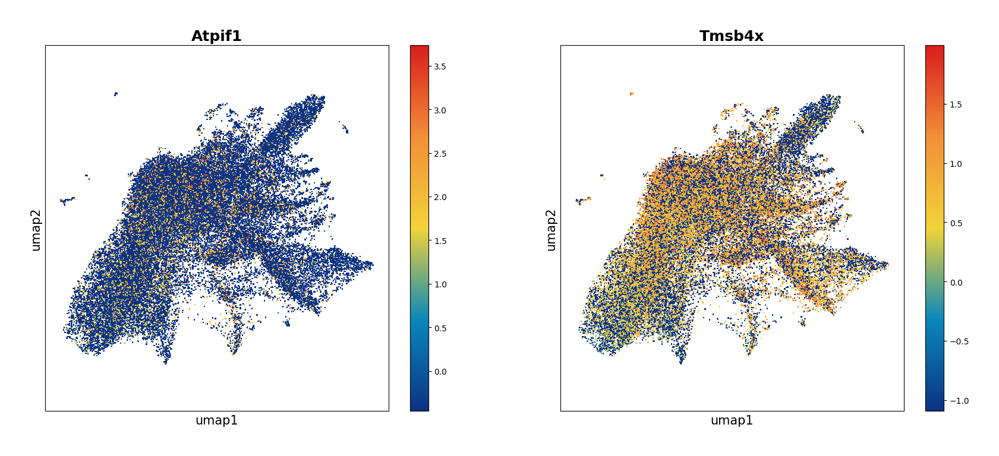

In [20]:
# plot the umap result of two genes: 'Atpif1' and 'Tmsb4x' 

data.plt.umap(gene_names=['Atpif1', 'Tmsb4x'], res_key='umap')

## Clustering

Currently we provide three common clustering methods, including **Leiden**, **Louvain** and **Phenograph**.

In this tool, you can re-run the normalization method before clustering if the parameter `normalize_method`  is not None. Then by default, we perform PCA to reduce the dimensionalites of the new normalization result, and use top 30 pcs to run clustering. 

At this stage, we strongly recommend using leiden. 

#### Leiden 

Simply run:

In [21]:
data.tl.leiden(neighbors_res_key='neighbors',res_key='leiden')

[2024-01-17 10:25:22][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run leiden...
[2024-01-17 10:25:56][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: leiden end, consume time 34.0871s.


Show the spatial distribution of the clustering result.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

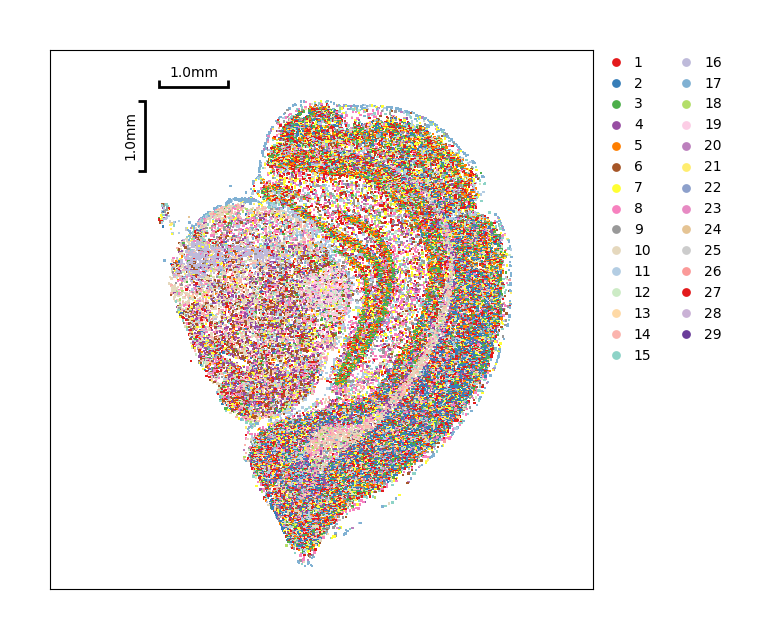

In [22]:
data.plt.cluster_scatter(res_key='leiden')

You also can only show partial clustering result.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

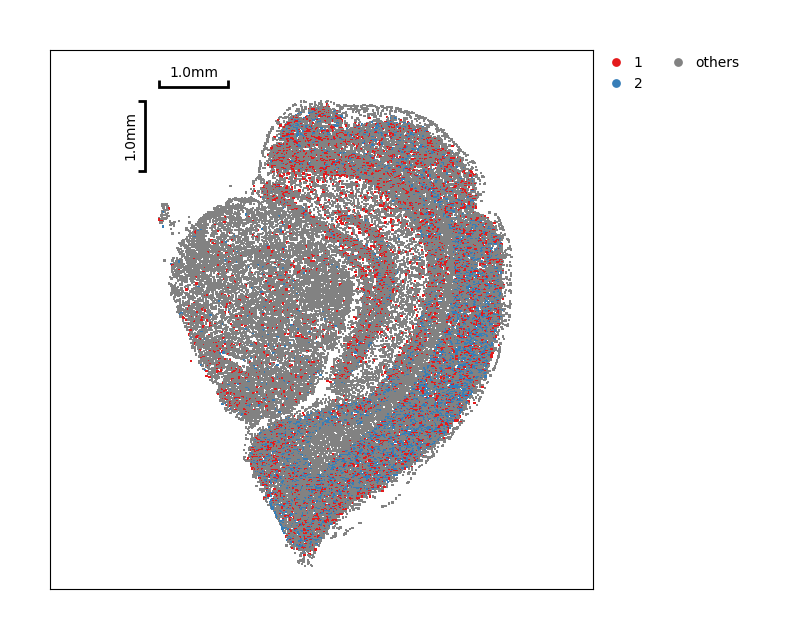

In [23]:
data.plt.cluster_scatter(res_key='leiden', groups=['1', '2'])

We can visulize the detail of cells base on clustering result. If set the parameter `base_image`, it will draw the ssDNA image as background and you can set transparency of foreground by the parameter `fg_alpha`.

In [24]:
data.plt.cells_plotting(color_by='cluster', color_key='leiden')
#data.plt.cells_plotting(color_by='cluster', color_key='leiden', base_image='./data/SS200000135TL_D1_regist.tif', fg_alpha=0.8)

Row
    [0] Column
        [0] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] Select(name='color theme', options=['diverging_isoluminant_cj...], value='stereo', visible=False, width=200)
        [1] Select(name='color theme', options=['diverging_isoluminant_cj...], value='stereo_30', width=200)
        [2] Select(name='color by', options=['cluster', 'total_count',...], value='cluster', width=200)
        [3] Checkbox(disabled=True, name='reverse colormap')
        [4] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] ColorPicker(name='cluster color', value='#E41A1C', width=70)
        [5] Select(disabled=True, name='gene names', options=['Gm1992', 'Gm37381', ...], size=10, value='Gm42418', visible=False, width=200)

Show the UMAP spatial distribution of the clustering result.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

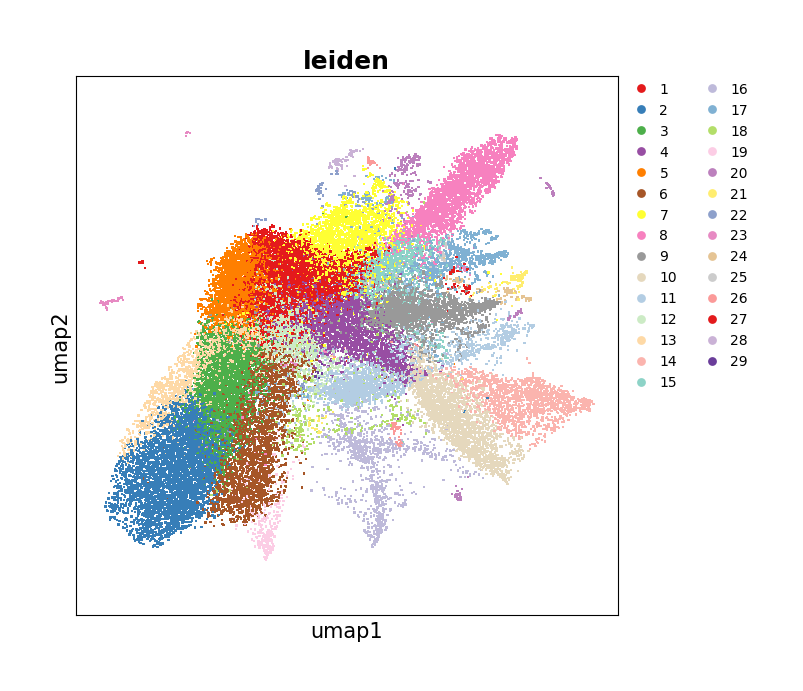

In [25]:
data.plt.umap(res_key='umap', cluster_key='leiden')

`data.plt.interact_cluster` generates an interact module from **Jupyter Notebook** and basic interactive manipulations could be done here. Simple clicks help you finish a series of operations, inclusing moving, tailoring, dyeing, saving and etc., over different clustering groups. More about in Interactive cluster.

In [26]:
data.plt.interact_cluster(res_key='leiden')

Row
    [0] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] ColorPicker(name='background color', value='#ffffff', width=200)
        [1] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [2] Select(name='color theme', options=['diverging_isoluminant_cj...], value='stereo_30', width=200)
        [3] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] ColorPicker(name='node color', value='#E41A1C', width=70)

#### Louvain

When clustering by Louvain algorithm, just run:

In [27]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain')

[2024-01-17 10:26:53][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run louvain...
[2024-01-17 10:26:54][Stereo][4130][MainThread][140049799059264][_louvain][109][INFO]:     using the "louvain" package of Traag (2017)
[2024-01-17 10:26:59][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: louvain end, consume time 5.3774s.


Show the spatial distribution of Louvain clustering.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

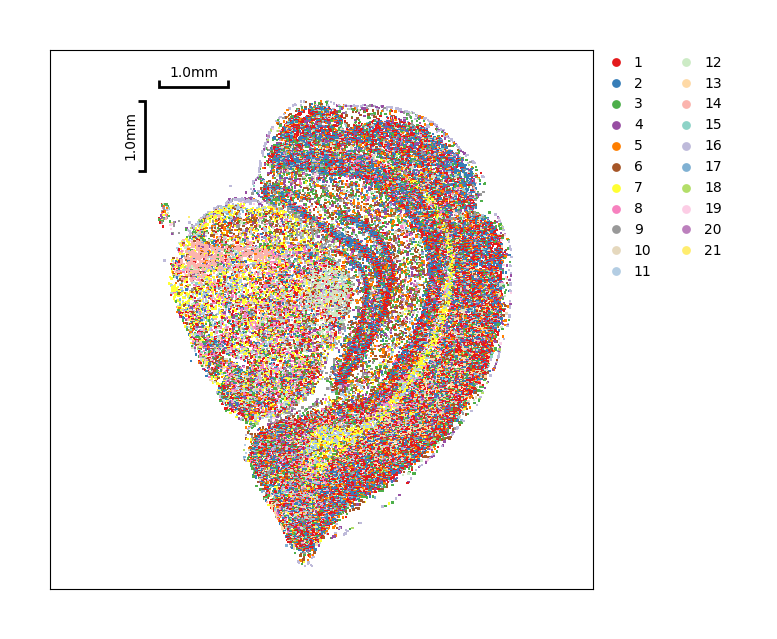

In [28]:
data.plt.cluster_scatter(res_key='louvain')

Same as Leiden, you can show detail of cells by the `data.plt.cells_plotting`.

#### Phenograph

When clustering by Phenograph algorithm, just run:

In [29]:
data.tl.phenograph(phenograph_k=30, pca_res_key='pca', res_key='phenograph')

[2024-01-17 10:27:00][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run phenograph...


Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.4412841796875 seconds
Jaccard graph constructed in 19.82186770439148 seconds
Running Leiden optimization
Leiden completed in 38.71576929092407 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 75.04625940322876 seconds


[2024-01-17 10:28:15][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: phenograph end, consume time 75.5243s.


Show the spatial distribution of Phenograph clustering.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

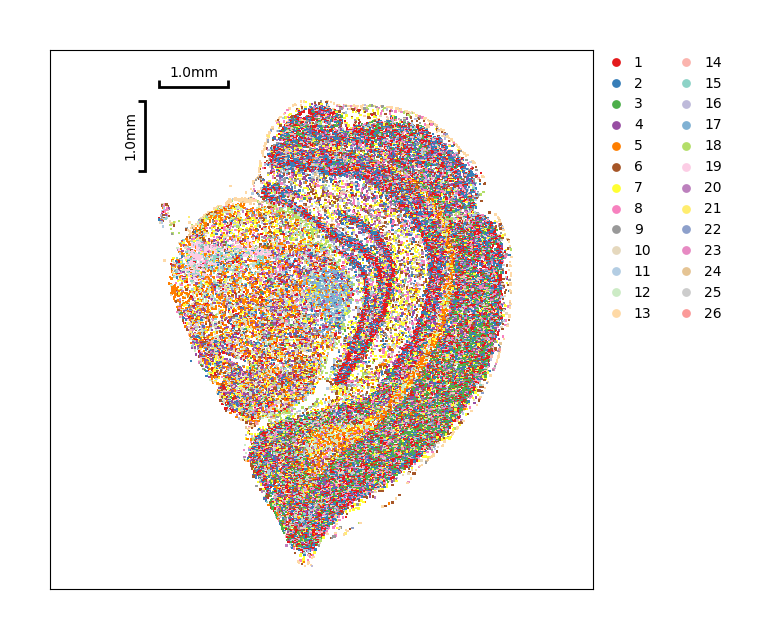

In [30]:
data.plt.cluster_scatter(res_key='phenograph')

Same as Leiden, you can show detail of cells by `data.plt.cells_plotting`.

##  Find Marker Genes

Hypothesis test is used to compute a ranking of differential genes among clusters. The raw count of express matrix which has been saved in `self.raw` by `data.tl.raw_checkpoint()` and highly variable genes are two optional data sets used to find marker genes.

Here supports two methods, `t_test` and `wilcoxon_test`, to find marker genes between pairs among all clusters. T-test as a more common and simple approach to do so.

In [31]:
data.tl.find_marker_genes(
        cluster_res_key='phenograph', 
        method='t_test', 
        use_highly_genes=False, 
        use_raw=True
        )

[2024-01-17 10:28:17][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run find_marker_genes...
[2024-01-17 10:28:17][Stereo][4130][MainThread][140049799059264][tool_base][122][INFO]: read group information, grouping by group column.
[2024-01-17 10:28:17][Stereo][4130][MainThread][140049799059264][tool_base][151][INFO]: start to run...
[2024-01-17 10:28:17][Stereo][4130][MainThread][140049799059264][time_consume][57][INFO]: start to run calc_pct_and_pct_rest...
[2024-01-17 10:28:17][Stereo][4130][MainThread][140049799059264][time_consume][60][INFO]: calc_pct_and_pct_rest end, consume time 0.4949s.
[2024-01-17 10:28:20][Stereo][4130][MainThread][140049799059264][tool_base][153][INFO]: end to run.
[2024-01-17 10:28:20][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: find_marker_genes end, consume time 3.5562s.


Display the ranking and scores of top 10 marker genes in each group.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

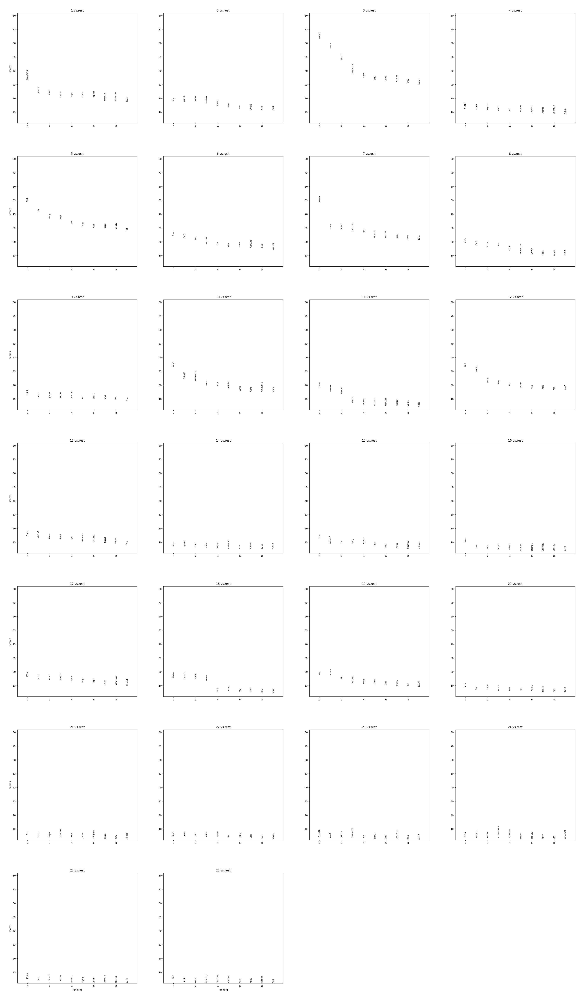

In [32]:
data.plt.marker_genes_text(
        res_key='marker_genes', 
        markers_num=10, 
        sort_key='scores'
        )

Display the scatter plot of top 5 marker genes in each group.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

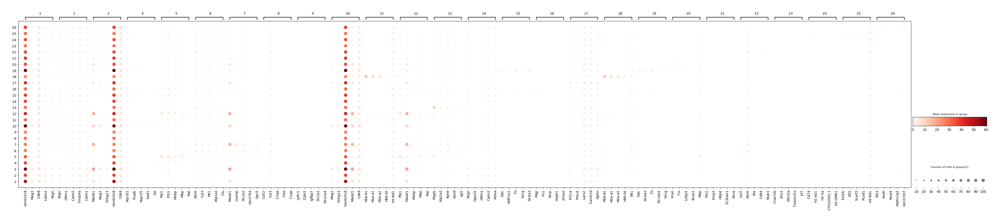

In [33]:
data.plt.marker_genes_scatter(res_key='marker_genes', markers_num=5)

Meanwhile, display the volcano plot of a specific group versus to the rest.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

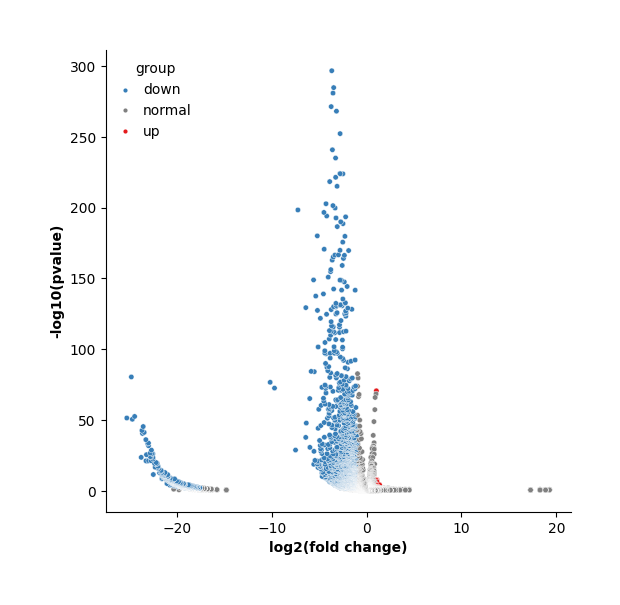

In [34]:
data.plt.marker_gene_volcano(group_name='2.vs.rest', vlines=False)

You can also filter out genes based on log fold change and fraction of genes expressing the gene within and outside each group.

In [35]:
data.tl.filter_marker_genes(
    marker_genes_res_key='marker_genes',
    min_fold_change=1,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    res_key='marker_genes_filtered'
)

[2024-01-17 10:28:36][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run filter_marker_genes...
[2024-01-17 10:28:38][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: filter_marker_genes end, consume time 1.4263s.


## Annotation

After finding marker genes, we can annotate clustering results by using `data.tl.annotation` or `data.plt.interact_annotation_cluster`.

In [36]:
data.plt.interact_annotation_cluster(
            res_cluster_key='leiden', 
            res_marker_gene_key='marker_genes', 
            res_key='leiden_annotation'
            )

Row
    [0] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [1] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] TextInput(name='annotation', width=100)
        [2] Button(name='Save annotation', width=200)
        [3] ParamFunction(function, _pane=DataFrame)

Use command lines to annotate clusters:

In [37]:
annotation_dict = {
    '1':'a',
    '2':'b',
    '3':'c',
    '4':'d',
    '5':'e',
    '6':'f',
    '7':'g',
    '8':'h',
    '9':'i',
    '10':'j',
    '11':'k',
    '12':'l',
    '13':'m',
    '14':'n',
    '15':'o',
    '16':'p',
    '17':'q',
    '18':'r',
    '19':'s',
    '20':'t',
    '21':'u',
    '22':'v',
    '23':'w',
    '24':'x',
    '25':'y',
    '26':'z',
    '27':'A',
    '28':'B'
    
}
data.tl.annotation(
        annotation_information=annotation_dict, 
        cluster_res_key='leiden', 
        res_key='anno_leiden'
        )

[2024-01-17 10:28:39][Stereo][4130][MainThread][140049799059264][st_pipeline][41][INFO]: start to run annotation...
[2024-01-17 10:28:40][Stereo][4130][MainThread][140049799059264][st_pipeline][44][INFO]: annotation end, consume time 0.3145s.


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

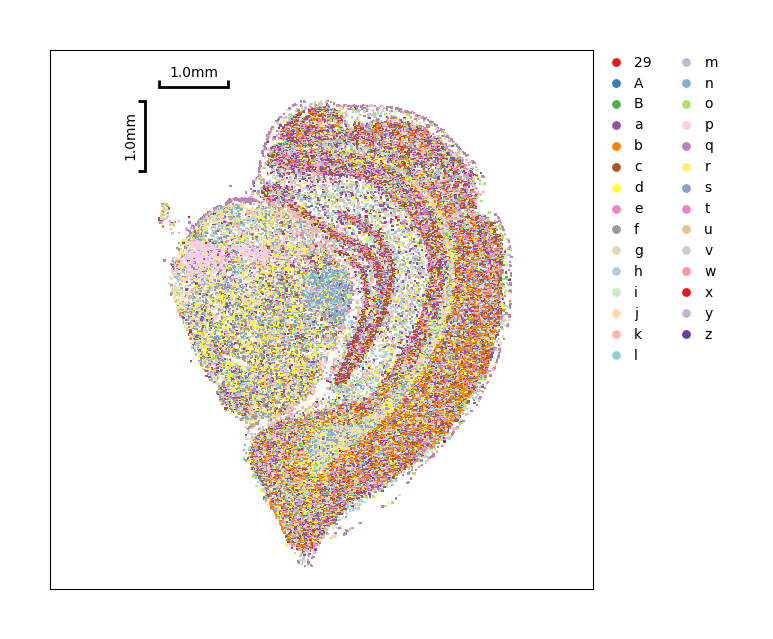

In [38]:
data.plt.cluster_scatter(res_key='anno_leiden')